In [1]:
from icevision.all import *
from fastai.callback.wandb import *

run = wandb.init(project="data-flywheel-validation-eva-bowling-ball", name="Fix 2", reinit=True)

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /root/.icevision/mmdetection_configs/mmdetection_configs-2.20.1/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17
03/18/2024 15:00:56 - ERROR - wandb.jupyter -   Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: dnth. Use `wandb login --relogin` to force relogin


In [2]:
artifact = wandb.Artifact("xmls", type="annotations")
artifact.add_dir("pascal_voc_annotations_bowling_ball/")
wandb.log_artifact(artifact)

wandb: Adding directory to artifact (./pascal_voc_annotations_bowling_ball)... Done. 0.1s


<Artifact xmls>

In [3]:
parser = parsers.VOCBBoxParser(annotations_dir='pascal_voc_annotations_bowling_ball/', 
                               images_dir='/workspace/yolo_v8_training/oiv7_full/validation/')

In [4]:
# Parse annotations to create records
train_records, valid_records = parser.parse() # Defaults to 80:20 split
parser.class_map

  0%|          | 0/73 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/73 [00:00<?, ?it/s]

WARNING  - (record_id: 1a42a0dba80e270b) - 🚫 Record could not be autofixed and will be removed because: File '/workspace/yolo_v8_training/oiv7_full/validation/1a42a0dba80e270b.xml' does not exist | icevision.core.record:autofix_records:100
WARNING  - (record_id: 2d1f6fa758b483b7) - 🚫 Record could not be autofixed and will be removed because: File '/workspace/yolo_v8_training/oiv7_full/validation/2d1f6fa758b483b7.xml' does not exist | icevision.core.record:autofix_records:100
WARNING  - (record_id: 6298c7ccf96b5257) - 🚫 Record could not be autofixed and will be removed because: File '/workspace/yolo_v8_training/oiv7_full/validation/6298c7ccf96b5257.xml' does not exist | icevision.core.record:autofix_records:100
WARNING  - (record_id: b1d6ef444903e180) - 🚫 Record could not be autofixed and will be removed because: File '/workspace/yolo_v8_training/oiv7_full/validation/b1d6ef444903e180.xml' does not exist | icevision.core.record:autofix_records:100


<ClassMap: {'background': 0, 'bowling_ball': 1}>

In [6]:
image_size = 640
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=720), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [7]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

In [8]:
print(f"Train on {len(train_ds)} images")
print(f"Validate on {len(valid_ds)} images")

Train on 55 images
Validate on 14 images


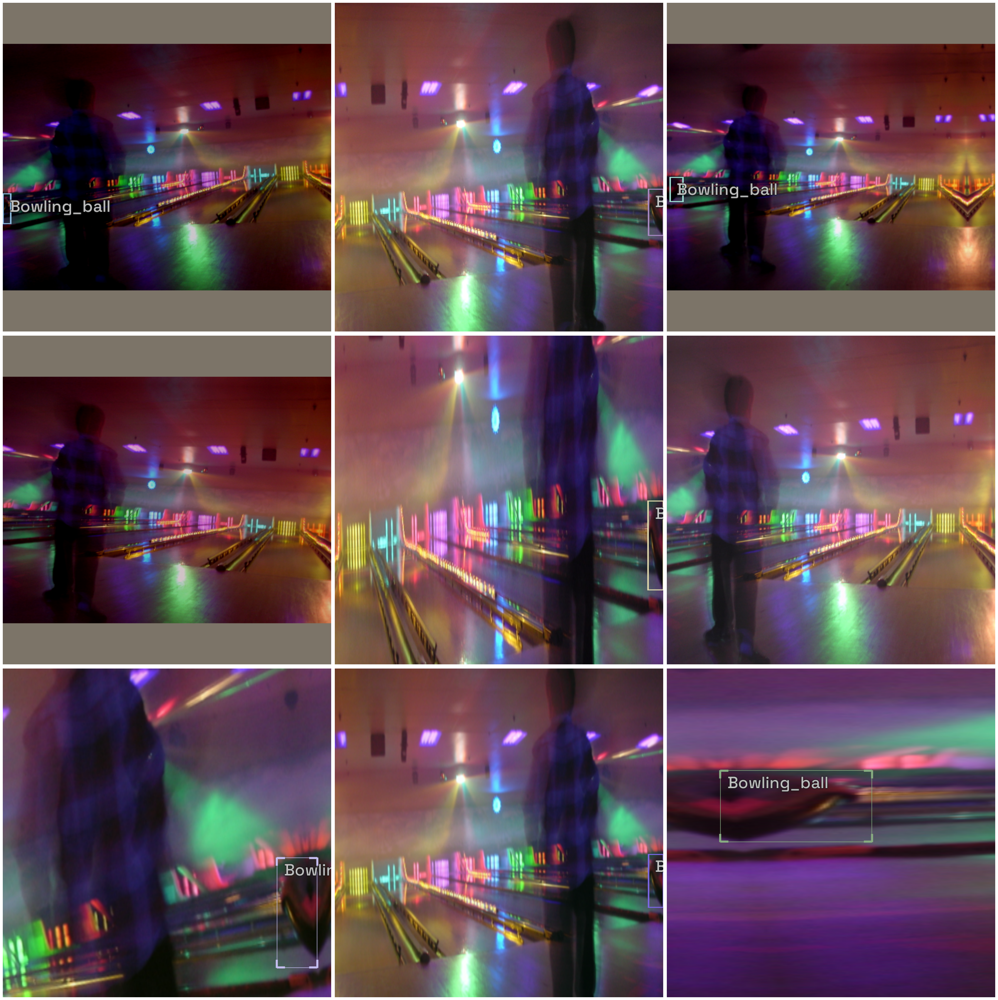

In [9]:
%matplotlib inline
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[1] for _ in range(9)]
show_samples(samples, ncols=3)

In [11]:
# model_type = models.mmdet.vfnet
# backbone = model_type.backbones.resnet50_fpn_mstrain_2x
# model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map)) 


artifact = run.use_artifact('dnth/data-flywheel-validation-eva-bowling-ball/vfnet-model:v0', type='trained-model-checkpoint')
artifact_dir = artifact.download()

# Load previously trained model
from icevision.models import *

# The model is automatically recreated in the evaluation mode. To unset that mode, you only need to pass `eval_mode=Fales`)
checkpoint_and_model = model_from_checkpoint('./models/model_checkpoint.pth')

model = checkpoint_and_model["model"]
model_type = checkpoint_and_model["model_type"]
class_map = checkpoint_and_model["class_map"]
img_size = checkpoint_and_model["img_size"]

wandb: Downloading large artifact vfnet-model:v0, 250.20MB. 2 files... 
wandb:   2 of 2 files downloaded.  
Done. 0:0:0.5


load checkpoint from local path: ./models/model_checkpoint.pth


2024-03-18 15:02:20,925 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2024-03-18 15:02:20,927 - mmcv - INFO - load model from: torchvision://resnet50
2024-03-18 15:02:20,927 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
2024-03-18 15:02:21,137 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2024-03-18 15:02:21,232 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2024-03-18 15:02:21,345 - mmcv - INFO - initialize VFNetHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'Normal', 'name': 'vfnet_cls', 'std': 0.01, 'bias_prob': 0.01}}
2024-03-18 15:02:21,424 - mmcv - INFO - 
backbone.conv1.weight - torch.Size([64, 3, 7, 7]): 
PretrainedInit: load from torchvision://resnet50 
 
2024-03-18 15:02:21,425 - mmcv - INFO -

In [12]:
train_dl = model_type.train_dl(train_ds, batch_size=16, num_workers=16, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers=16, shuffle=False)

In [13]:
from fastai.callback.tracker import SaveModelCallback

metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

learn = model_type.fastai.learner(dls=[train_dl, valid_dl], 
                                  model=model, 
                                  metrics=metrics,
                                  cbs=[WandbCallback(), SaveModelCallback(fname='best_model')])

/root/miniforge-pypy3/envs/icevision/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


SuggestedLRs(valley=2.0892961401841603e-05)

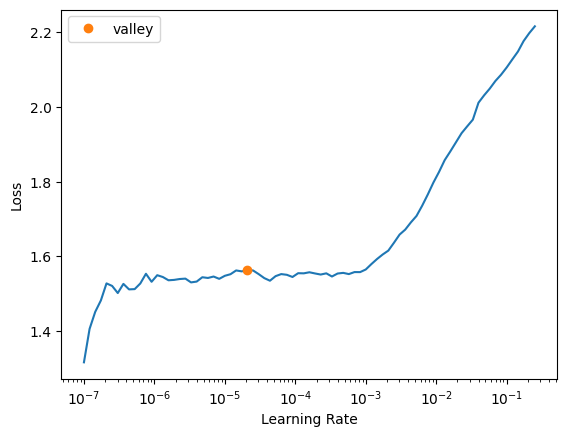

In [14]:
learn.lr_find()

In [15]:
learn.fine_tune(20, 1e-5, freeze_epochs=10)

Could not gather input dimensions
WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'Dataset' object has no attribute 'items'


epoch,train_loss,valid_loss,COCOMetric,time
0,1.538992,1.410193,0.299274,00:07
1,1.593798,1.409590,0.297637,00:07
2,1.564602,1.408473,0.301426,00:07
3,1.578653,1.407653,0.304025,00:07
4,1.566073,1.406392,0.303058,00:07
5,1.583548,1.405810,0.304910,00:07
6,1.586588,1.405372,0.304320,00:07
7,1.576678,1.404722,0.303671,00:07
8,1.566739,1.405054,0.300284,00:07
9,1.569448,1.407887,0.297783,00:07


Better model found at epoch 0 with valid_loss value: 1.4101933240890503.
Better model found at epoch 1 with valid_loss value: 1.4095895290374756.
Better model found at epoch 2 with valid_loss value: 1.408473014831543.
Better model found at epoch 3 with valid_loss value: 1.407652735710144.
Better model found at epoch 4 with valid_loss value: 1.4063920974731445.
Better model found at epoch 5 with valid_loss value: 1.4058096408843994.
Better model found at epoch 6 with valid_loss value: 1.4053715467453003.
Better model found at epoch 7 with valid_loss value: 1.4047216176986694.
Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.567372,1.405102,0.301367,00:07
1,1.579537,1.405317,0.302252,00:07
2,1.567833,1.405611,0.302163,00:07
3,1.546137,1.406577,0.299613,00:07
4,1.527469,1.407423,0.299743,00:07
5,1.523171,1.407415,0.299615,00:07
6,1.525427,1.408171,0.298741,00:07
7,1.526008,1.410275,0.293120,00:07
8,1.539540,1.411535,0.293431,00:07
9,1.533924,1.410811,0.298656,00:07


Better model found at epoch 0 with valid_loss value: 1.4051024913787842.


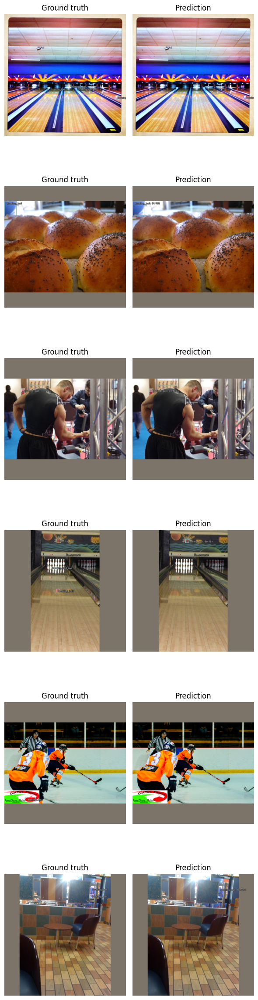

In [16]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

INFO     - Losses returned by model: ['loss_cls', 'loss_bbox'] | icevision.models.interpretation:plot_top_losses:219


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

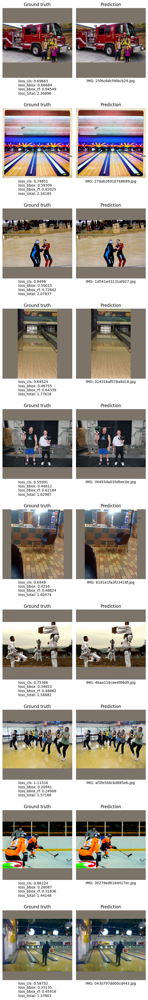

In [17]:
sorted_samples, sorted_preds, losses_stats = model_type.interp.plot_top_losses(model, valid_ds, sort_by="loss_total", n_samples=10)

In [18]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=8)
preds = model_type.predict_from_dl(model=model, infer_dl=infer_dl, keep_images=True)

# Create wandb_images for each prediction
wandb_images = wandb_img_preds(preds, add_ground_truth=True) 

# Log the wandb_images to wandb
wandb.log({"Predicted images from validation ds": wandb_images})

  0%|          | 0/2 [00:00<?, ?it/s]

In [19]:
wandb_images = wandb_img_preds(sorted_preds, add_ground_truth=True) 
wandb.log({"Highest loss images": wandb_images})

In [20]:
from icevision.models.checkpoint import *
save_icevision_checkpoint(model,
                        model_name='mmdet.vfnet', 
                        backbone_name='resnet50_fpn_mstrain_2x',
                        img_size=640,
                        classes=parser.class_map.get_classes(),
                        filename='./models/model_checkpoint.pth',
                        meta={'icevision_version': 'master'})

In [21]:
artifact = wandb.Artifact("vfnet-model", type="trained-model-checkpoint")
artifact.add_dir("models/")
wandb.log_artifact(artifact)

wandb: Adding directory to artifact (./models)... Done. 0.2s


<Artifact vfnet-model>

In [22]:
to_relabel = [pred.record_id + '.xml' for pred in sorted_preds]

In [23]:
to_relabel

['25f6c6dcf46bcb29.xml',
 '27dab26916768689.xml',
 '1d541e43131afd27.xml',
 '02431baf078a8d18.xml',
 '36493da035dbec0e.xml',
 '8181e1fa3f23418f.xml',
 '46aa118cee4f86d9.xml',
 'af3fe568cbd885eb.xml',
 '30279ed616d417ec.xml',
 '0430797dd00cd443.xml',
 'bc02cb0ec216ac9a.xml',
 '4bbf51fd1bffc41b.xml',
 'f302ff10c761bf24.xml',
 '0fa056dcede09fa2.xml']

In [24]:
with open('relabel_list.txt', 'w') as file:
    file.write('\n'.join(to_relabel))

In [25]:
artifact = wandb.Artifact("xml-files", type="relabel-list")
artifact.add_file("relabel_list.txt")
wandb.log_artifact(artifact)

<Artifact xml-files>

In [26]:
wandb.finish()

COCOMetric,▅▄▆▇▇██▇▅▄▆▆▆▅▅▅▄▁▁▄▄▄▅▄▄▅▄▅▅▅
epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
eps_0,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_1,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_2,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_3,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_4,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_5,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eps_6,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_0,▁▁▂▂▃▃▄▅▆▆▇███▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr_1,▁▁▂▂▃▃▄▅▆▆▇███▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
